# Items to be covered 

1. Introduce fine-tuning transfer learning with TF
2. Intriduce Keras Functional API to build models
3. Using a small dataset to experiement faster (e.g. 10% of traning samples)
4. Data augmentation within the model
5. Running series of experiments on Food Vision Data
6. Introduce ModelCheckpoint callback to save intemediate training results

In [1]:
!nvidia-smi

Tue Dec 23 05:00:49 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 590.44.01              Driver Version: 591.44         CUDA Version: 13.1     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 5070 ...    On  |   00000000:01:00.0  On |                  N/A |
| N/A   49C    P8              7W /   82W |     312MiB /  12227MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import tensorflow as tf 
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.image as mpimage 
import keras 
from helpers import walk_data_directory, import_and_create_train_test_ds, display_tensorboard_logs, view_all_images_in_a_batch_ds, create_tensorboard_callback, plot_loss_curves

In [3]:
data_dir = "data/10_food_classes_10_percent/"
train_dir = "data/10_food_classes_10_percent/train/"
test_dir = "data/10_food_classes_10_percent/test" 

In [4]:
walk_data_directory(data_dir)

There are 2 folders and 0 in 'data/10_food_classes_10_percent/'
There are 10 folders and 0 in 'data/10_food_classes_10_percent/test'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/chicken_curry'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/chicken_wings'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/fried_rice'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/grilled_salmon'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/hamburger'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/ice_cream'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/pizza'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/ramen'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/steak'
There are 0 folders and 250 in 'data/10_food_classes_10_percent/test/sushi'
There are 10 folders and 0 in 'data/10_food_classes_10_percent/train'

In [5]:
train_ds, test_ds = import_and_create_train_test_ds(train_dir=train_dir,
                                                   test_dir=test_dir)

Found 750 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


In [6]:
class_names = train_ds.class_names
class_names

['chicken_curry',
 'chicken_wings',
 'fried_rice',
 'grilled_salmon',
 'hamburger',
 'ice_cream',
 'pizza',
 'ramen',
 'steak',
 'sushi']

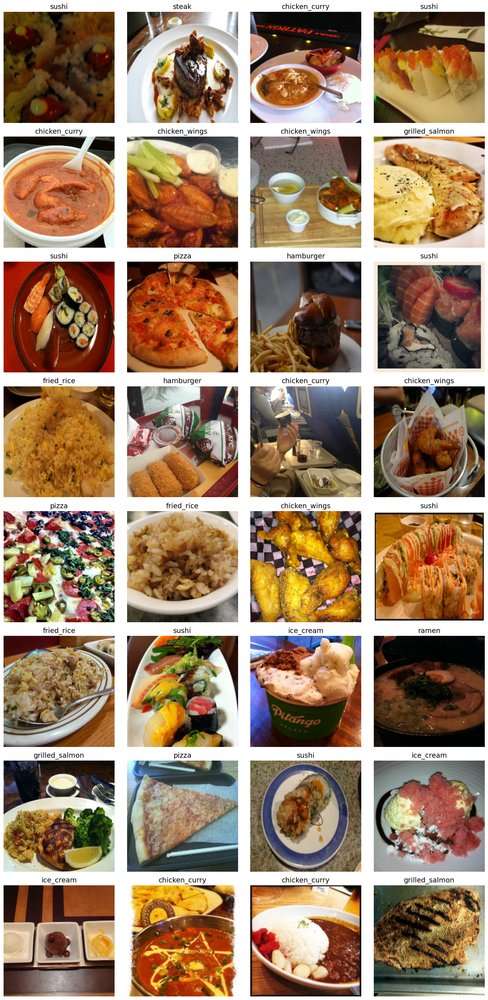

In [7]:
view_all_images_in_a_batch_ds(train_ds)

In [8]:
def build_efficientv2_models(variant="B0",
                             num_classes=len(class_names), 
                             base_trainable=False, 
                             lr=1e-3,
                             batch_size=32, 
                             dropout=0.2
                            ): 

    model_name = f"EfficientNetV2{variant}"
    try:
        BaseModel = getattr(keras.applications, model_name)
    except AttributeError:
        raise ValueError(f"Invalid EfficientNetV2 variant: {variant}")

    EFFICIENTNETV2_SIZES = {
        "B0": (224, 224),
        "B1": (240, 240),
        "B2": (260, 260),
        "B3": (300, 300),
        "S":  (384, 384),
        "M":  (480, 480),
        "L":  (480, 480),
    }

    img_size = EFFICIENTNETV2_SIZES[variant]

    base_model = BaseModel(
                    include_top=False,
                    weights="imagenet",
                    input_shape=img_size + (3,),
                    pooling="avg",
                )

    base_model.trainable = base_trainable 

    inputs = keras.Input(shape=img_size+(3,), name="input_layer") 
    x = keras.applications.efficientnet_v2.preprocess_input(inputs) 
    x = base_model(x, training=False)
    # x=keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
    x = keras.layers.Dropout(dropout)(x)
    outputs = keras.layers.Dense(num_classes, activation='softmax', name="output_layer")(x) 

    model = keras.Model(inputs, outputs, name=model_name) 
    model.compile(
        loss=keras.losses.CategoricalCrossentropy(), 
        optimizer=keras.optimizers.Adam(learning_rate=lr), 
        metrics=["accuracy"]
    )
    return model

efficientnetv2b0_model = build_efficientv2_models(variant="B0", 
                                                  num_classes=len(class_names))

efficientnetv2b0_model.summary()
    

Model: "EfficientNetV2B0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 1280)           │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 10)             │        12,810 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [9]:
history_efficientnetv2b0 = efficientnetv2b0_model.fit(
                                train_ds,
                                validation_data=test_ds, 
                                epochs=6, 
                                validation_steps=int(0.25 * (len(test_ds))), 
                                callbacks=[create_tensorboard_callback(
                                                        dir_name="/workspace/tensorflow/tensorboard/",
                                                        experiment_name="EfficientNetV2B0"
                                                        )
                                          ]
                            )

Saving TensorBoard log files to /workspace/tensorflow/tensorboard/EfficientNetV2B0/20251223-050057
Epoch 1/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 32s 564ms/step - accuracy: 0.2233 - loss: 2.1606 - val_accuracy: 0.7155 - val_loss: 1.4001
Epoch 2/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.6580 - loss: 1.3211 - val_accuracy: 0.7862 - val_loss: 0.9728
Epoch 3/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.7779 - loss: 0.9271 - val_accuracy: 0.8306 - val_loss: 0.7936
Epoch 4/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8458 - loss: 0.7374 - val_accuracy: 0.8536 - val_loss: 0.6720
Epoch 5/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 5s 211ms/step - accuracy: 0.8449 - loss: 0.6480 - val_accuracy: 0.8088 - val_loss: 0.6024
Epoch 6/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - accuracy: 0.8681 - loss: 0.5674 - val_accuracy: 0.8586 - val_loss: 0.5330


In [10]:
for layer_number, layer in enumerate(efficientnetv2b0_model.layers): 
    print(layer_number, layer.name)

0 input_layer
1 efficientnetv2-b0
2 dropout
3 output_layer


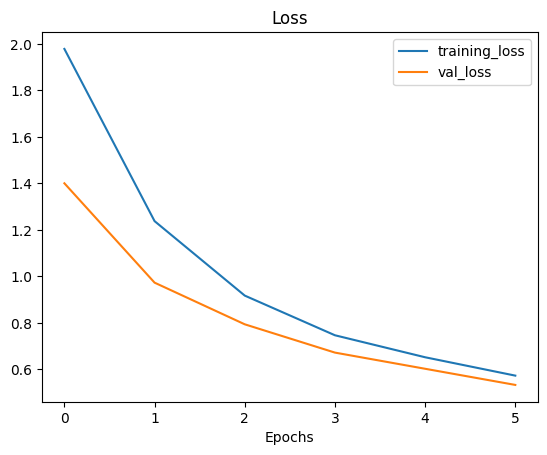

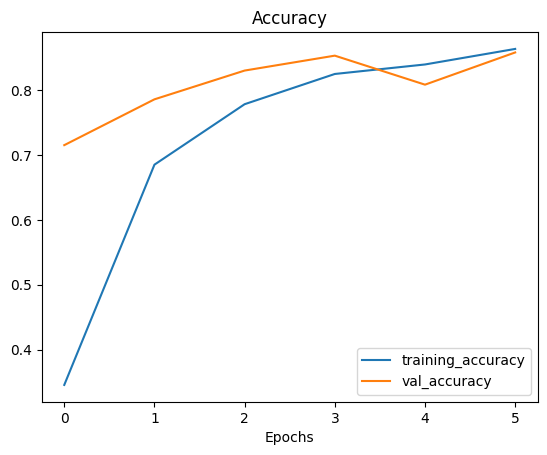

In [11]:
plot_loss_curves(history_efficientnetv2b0)

In [12]:
## Extracting vector out of the model 

shape = (1, 7, 7, 5)
tf_1 = tf.random.normal(shape=shape)

In [13]:
tf_1_vecorized = keras.layers.GlobalAveragePooling2D()(tf_1)
tf_1_vecorized

<tf.Tensor: shape=(1, 5), dtype=float32, numpy=
array([[-0.28420147,  0.12852858, -0.04714606, -0.02565866,  0.03685184]],
      dtype=float32)>

In [14]:
tf.reduce_mean(tf_1, axis=(1, 2))

<tf.Tensor: shape=(1, 5), dtype=float32, numpy=
array([[-0.28420147,  0.12852858, -0.04714606, -0.02565866,  0.03685184]],
      dtype=float32)>

In [15]:
tf_1_max_pooled = keras.layers.GlobalMaxPool2D()(tf_1)
tf_1_max_pooled


<tf.Tensor: shape=(1, 5), dtype=float32, numpy=
array([[1.7843288, 3.0433676, 2.4948514, 2.0459793, 2.2704902]],
      dtype=float32)>

In [16]:
## Sample efficientv2 model with GlobalAveragePooloing2d 

# 1. Create base model with keras.applications api 
# base_model = keras.applications.EfficientNetV2B0(include_top=False, name="base_model")
base_model = keras.applications.EfficientNetV2B0(include_top=False)

# 2. Freeze the base model (so the pre-learned patterns remain) 
base_model.trainable=False 

# 3. Create inputs into base_model
inputs=keras.Input(shape=(224, 224, 3), name="input_layer")

# 4. If using ResNet50V2, add this to speed up convergence, remove for EfficientNetV2
# x = tf.keras.layers.experimental.preprocessing.Rescaling(1./255)(inputs)

# 5. Pass the inputs to the base model 
x = base_model(inputs) 
# Check inputs shape after passing inputs to base model 
print(f"Shape after base_model : {x.shape}") 

# 6. Average pool the outputs of the base model (aggregate all the most important information, reduce number of computations) 
x = keras.layers.GlobalAveragePooling2D(name="GlobalAveragePooling2D")(x) 
print(f"Shape after GlobalAveragePooling2D() : {x.shape}") 

# 7. Create the output for the activation layer 
outputs = keras.layers.Dense(10, activation="softmax", name="output_layer")(x) 

# 8. Create the model 
model_0 = keras.Model(inputs, outputs, name="EfficientNetV2B0")

# 9. Compile the model 
model_0.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    optimizer=keras.optimizers.Adam(), 
    metrics=["accuracy"]
)

# 10. Get Model Summary 
model_0.summary() 

# 11. Fit the mmodel_0 
model_0.fit(
    train_ds, 
    validation_data=test_ds, 
    epochs=6,
    validation_steps=int(0.25 * (len(test_ds))),
    callbacks=[create_tensorboard_callback(
        dir_name="/workspace/tensorflow/tensorboard/", 
        experiment_name=""
    )]
)

Shape after base_model : (None, 7, 7, 1280)
Shape after GlobalAveragePooling2D() : (None, 1280)


Model: "EfficientNetV2B0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ GlobalAveragePooling2D          │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 10)             │        12,810 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

Saving TensorBoard log files to /workspace/tensorflow/tensorboard/20251223-050139
Epoch 1/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 24s 428ms/step - accuracy: 0.3315 - loss: 2.0560 - val_accuracy: 0.7549 - val_loss: 1.2688
Epoch 2/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.7351 - loss: 1.2016 - val_accuracy: 0.8043 - val_loss: 0.9049
Epoch 3/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.8083 - loss: 0.8906 - val_accuracy: 0.8339 - val_loss: 0.7353
Epoch 4/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8385 - loss: 0.6943 - val_accuracy: 0.8586 - val_loss: 0.6063
Epoch 5/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 3s 110ms/step - accuracy: 0.8553 - loss: 0.6022 - val_accuracy: 0.8088 - val_loss: 0.6750
Epoch 6/6
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - accuracy: 0.8786 - loss: 0.5285 - val_accuracy: 0.8783 - val_loss: 0.4997


## Running a series of Transfer Learning Experiences 

1. Done 

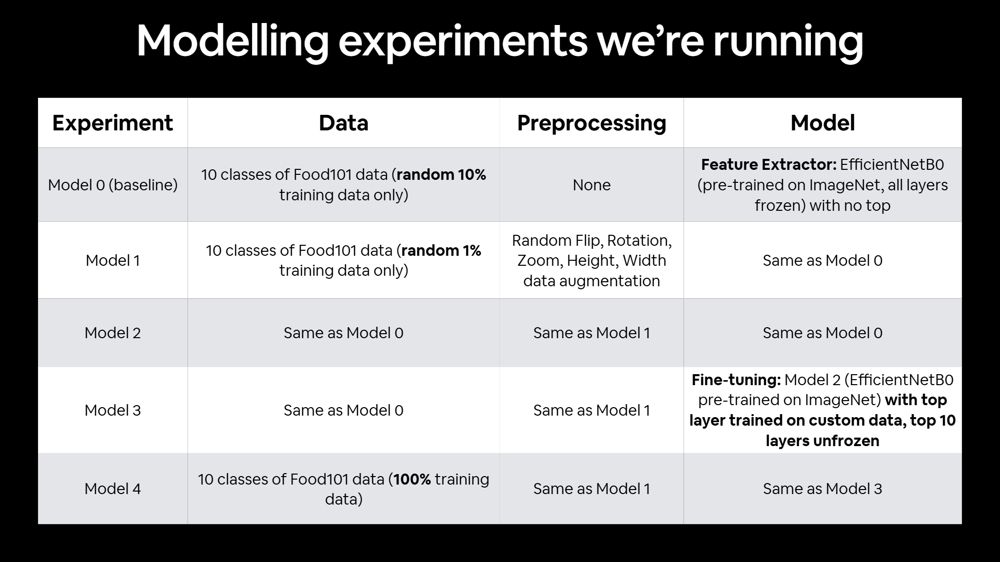

### Model-1 
**feature extraction** transfer learning  with **1%** of the training data  and **data augmentation** 

### Model-2 
**feature extraction** transfer learning  with **10%** of the training data  and **data augmentation**  

### Model-3 
**fine tuning** transfer learning  with **10%** of the training data  and **data augmentation**  

### Model-4
**fine tuning** transfer learning  with **100%** of the training data  and **data augmentation**  

In [17]:
train_dir_1_percent = "data/10_food_classes_1_percent/train/" 
test_dir_1_percent = "data/10_food_classes_1_percent/test/"

In [18]:
walk_data_directory("data/10_food_classes_1_percent/")

There are 2 folders and 0 in 'data/10_food_classes_1_percent/'
There are 10 folders and 0 in 'data/10_food_classes_1_percent/test'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/chicken_curry'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/chicken_wings'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/fried_rice'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/grilled_salmon'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/hamburger'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/ice_cream'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/pizza'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/ramen'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/steak'
There are 0 folders and 250 in 'data/10_food_classes_1_percent/test/sushi'
There are 10 folders and 0 in 'data/10_food_classes_1_percent/train'
There are 0 

In [19]:
# Create 1_percent train & test dataset
train_ds_1_percent, test_ds_1_percent = import_and_create_train_test_ds(train_dir=train_dir_1_percent, 
                                                                       test_dir=test_dir_1_percent)

Found 70 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


## Adding Data Augmentation right into the model

In [20]:
print(tf.__version__)

2.17.0


In [21]:
import tensorflow as tf 
import keras 
from keras import layers

## Benefits of data augmentation 

https://www.tensorflow.org/tutorials/images/data_augmentation

* Preprocessing of images (augmentation) happens on GPU
* Image data augmentation only happens training, we can still export our whole model and use it elsewhere 

In [22]:
## Create data augmentation stage with horizontal flipping, rotations, zooms, etc 

from keras import layers
import keras

data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(
            height_factor=(-0.2, 0.2),
            width_factor=(-0.2, 0.2),
        ),
        layers.RandomBrightness(0.2),
        layers.RandomContrast(0.2),
    ],
    name="data_augmentation",
)

In [23]:
import math
import numpy as np
import matplotlib.pyplot as plt

def view_same_image_multiple_augmentations(
    data_ds,
    data_augmentation,
    num_images=4,
    num_augments=4,
    img_size=3.5,
    show_original=True,
):
    class_names = getattr(data_ds, "class_names", None)

    images, labels = next(iter(data_ds))
    images = images[:num_images]
    labels = labels[:num_images]

    cols = num_augments + (1 if show_original else 0)
    rows = num_images

    plt.figure(figsize=(cols * img_size, rows * img_size))

    plot_idx = 1
    for i in range(num_images):
        # label
        if labels.ndim == 1:
            label_idx = int(labels[i].numpy())
        else:
            label_idx = int(np.argmax(labels[i].numpy()))
        label_name = class_names[label_idx] if class_names else str(label_idx)

        # original
        if show_original:
            plt.subplot(rows, cols, plot_idx)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(f"{label_name}\n(original)", fontsize=12)
            plt.axis("off")
            plot_idx += 1

        # augmented versions (same image, multiple draws)
        for j in range(num_augments):
            plt.subplot(rows, cols, plot_idx)

            aug_img = data_augmentation(images[i], training=True).numpy()

            if aug_img.dtype != np.uint8:
                aug_img = np.clip(aug_img, 0, 255).astype("uint8")

            plt.imshow(aug_img)
            plt.title(f"aug {j+1}", fontsize=11)
            plt.axis("off")
            plot_idx += 1

    plt.tight_layout()
    plt.show()


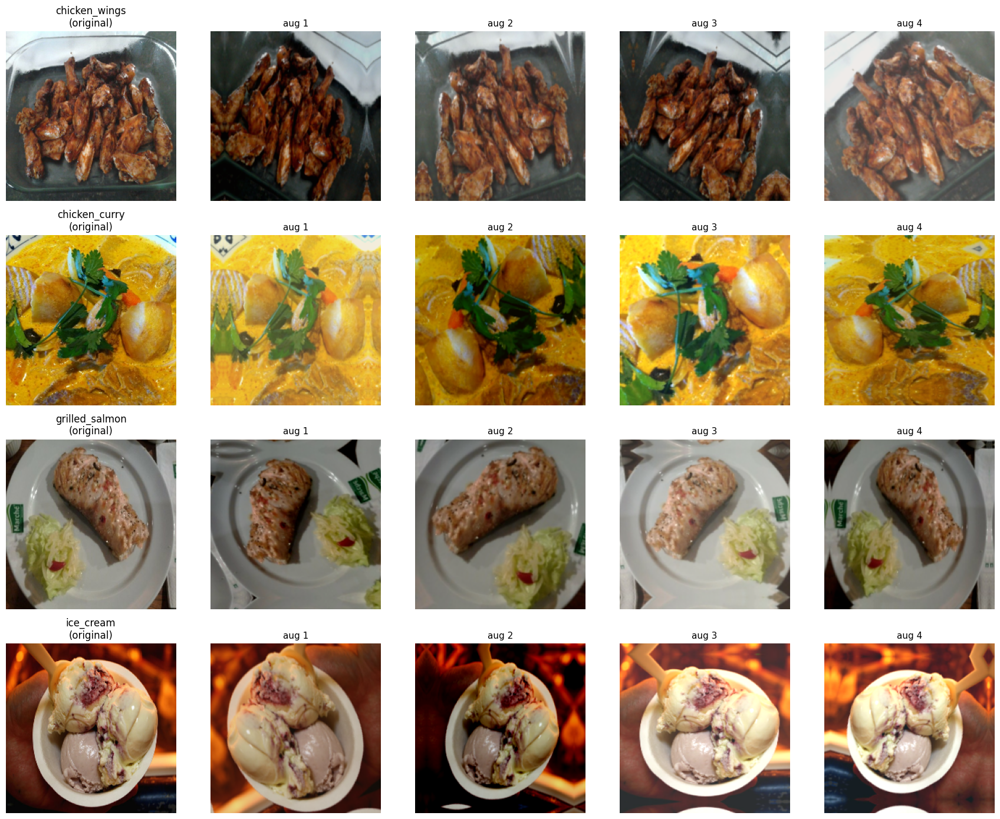

In [24]:
view_same_image_multiple_augmentations(
    train_ds,
    data_augmentation,
    num_images=4,
    num_augments=4,
    img_size=3.5,
)


In [25]:
import keras
from keras import layers

data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(
            height_factor=(-0.2, 0.2),
            width_factor=(-0.2, 0.2),
        ),
        layers.RandomBrightness(0.2),
        layers.RandomContrast(0.2),
    ],
    name="data_augmentation",
)

# 1) Base model (feature extractor)
base_model = keras.applications.EfficientNetV2B0(
    include_top=False,
    weights="imagenet",
    input_shape=(224, 224, 3),
)
base_model.trainable = False

# 2) Build model
inputs = keras.Input(shape=(224, 224, 3), name="input_layer")

x = data_augmentation(inputs)                 # ✅ augment images
# x = layers.Rescaling(1./255)(x)               # ✅ if your inputs are 0..255 (common)
x = base_model(x, training=False)             # ✅ keep BN in inference mode
x = layers.GlobalAveragePooling2D(name="gap")(x)

outputs = layers.Dense(10, activation="softmax", name="output_layer")(x)

model_1 = keras.Model(inputs, outputs, name="experiment_1")

model_1.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    optimizer=keras.optimizers.Adam(),
    metrics=[keras.metrics.CategoricalAccuracy(name="accuracy")]
)

model_1.summary()


Model: "experiment_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 10)             │        12,810 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [26]:
history_1 = model_1.fit(
    train_ds_1_percent,
    validation_data=test_ds_1_percent, 
    callbacks=[
        create_tensorboard_callback(
            dir_name="/workspace/tensorflow/tensorboard/", 
            experiment_name="one_percent_data_aug"
        )
    ],
    epochs=6, 
    verbose=2
)

Saving TensorBoard log files to /workspace/tensorflow/tensorboard/one_percent_data_aug/20251223-050212
Epoch 1/6
3/3 - 14s - 5s/step - accuracy: 0.1143 - loss: 2.4022 - val_accuracy: 0.1708 - val_loss: 2.2508
Epoch 2/6
3/3 - 2s - 738ms/step - accuracy: 0.1857 - loss: 2.1323 - val_accuracy: 0.2280 - val_loss: 2.1289
Epoch 3/6
3/3 - 2s - 722ms/step - accuracy: 0.3143 - loss: 1.9955 - val_accuracy: 0.2840 - val_loss: 2.0198
Epoch 4/6
3/3 - 2s - 673ms/step - accuracy: 0.4857 - loss: 1.8119 - val_accuracy: 0.3540 - val_loss: 1.9181
Epoch 5/6
3/3 - 2s - 693ms/step - accuracy: 0.5714 - loss: 1.6894 - val_accuracy: 0.4016 - val_loss: 1.8280
Epoch 6/6
3/3 - 2s - 706ms/step - accuracy: 0.7143 - loss: 1.5126 - val_accuracy: 0.4492 - val_loss: 1.7467


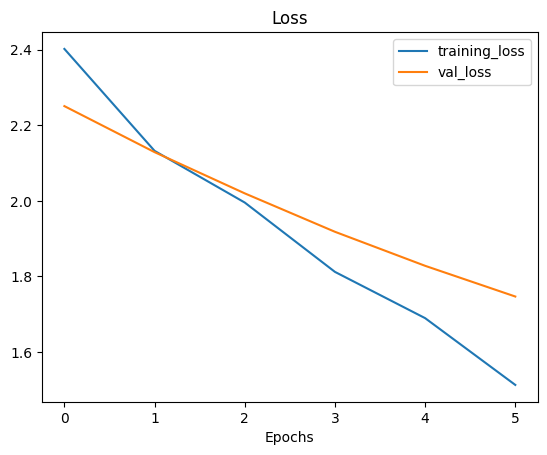

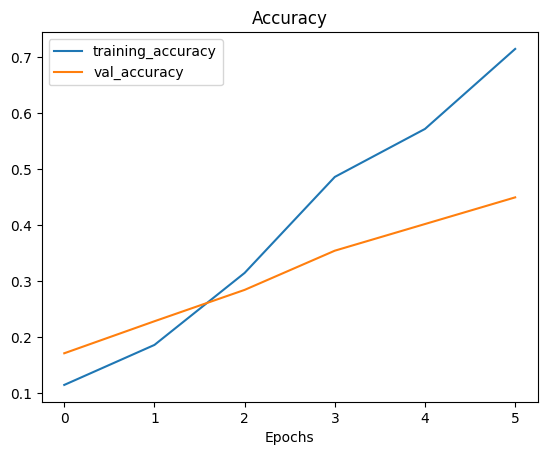

In [27]:
plot_loss_curves(history_1)

In [28]:
## Model 2 : Feature extraction, data_augmentation, 10_percent_train_data 

import keras
from keras import layers

data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.1),
        layers.RandomZoom(
            height_factor=(-0.2, 0.2),
            width_factor=(-0.2, 0.2),
        ),
        layers.RandomBrightness(0.2),
        layers.RandomContrast(0.2),
    ],
    name="data_augmentation",
)

# 1) Base model (feature extractor)
base_model = keras.applications.EfficientNetV2B0(
    include_top=False,
    weights="imagenet",
    input_shape=(224, 224, 3),
)
base_model.trainable = False

# 2) Build model
inputs = keras.Input(shape=(224, 224, 3), name="input_layer")

x = data_augmentation(inputs)                 # ✅ augment images
# x = layers.Rescaling(1./255)(x)               # ✅ if your inputs are 0..255 (common)
x = base_model(x, training=False)             # ✅ keep BN in inference mode
x = layers.GlobalAveragePooling2D(name="gap")(x)

outputs = layers.Dense(10, activation="softmax", name="output_layer")(x)

model_2 = keras.Model(inputs, outputs, name="experiment_1")

model_2.compile(
    loss=keras.losses.CategoricalCrossentropy(),
    optimizer=keras.optimizers.Adam(),
    metrics=[keras.metrics.CategoricalAccuracy(name="accuracy")]
)

model_2.summary()


Model: "experiment_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 10)             │        12,810 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 12,810 (50.04 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [29]:
def create_model_checkpoint_callback(dir_name, experiment_name):
    checkpoint_path = os.path.join(
        dir_name,
        experiment_name,
        "ckpt-epoch{epoch:02d}.weights.h5"
    )

    return keras.callbacks.ModelCheckpoint(
        filepath=checkpoint_path,
        save_weights_only=True,
        save_best_only=False,
        save_freq="epoch",
        verbose=1,
    )


In [30]:
initial_epochs = 5
history_2 = model_2.fit(
    train_ds,
    validation_data=test_ds, 
    callbacks=[
        create_tensorboard_callback(
            dir_name="/workspace/tensorflow/tensorboard/", 
            experiment_name="ten_percent_data_aug"
        ),
        create_model_checkpoint_callback(
            dir_name="/workspace/tensorflow/tensorboard/", 
            experiment_name="ten_percent_data_aug"
        )
    ],
    epochs=initial_epochs, 
    verbose=2
)

Saving TensorBoard log files to /workspace/tensorflow/tensorboard/ten_percent_data_aug/20251223-050238
Epoch 1/5

Epoch 1: saving model to /workspace/tensorflow/tensorboard/ten_percent_data_aug/ckpt-epoch01.weights.h5
24/24 - 15s - 608ms/step - accuracy: 0.3560 - loss: 2.0033 - val_accuracy: 0.6748 - val_loss: 1.4526
Epoch 2/5

Epoch 2: saving model to /workspace/tensorflow/tensorboard/ten_percent_data_aug/ckpt-epoch02.weights.h5
24/24 - 3s - 137ms/step - accuracy: 0.6520 - loss: 1.4106 - val_accuracy: 0.7644 - val_loss: 1.0262
Epoch 3/5

Epoch 3: saving model to /workspace/tensorflow/tensorboard/ten_percent_data_aug/ckpt-epoch03.weights.h5
24/24 - 3s - 135ms/step - accuracy: 0.7333 - loss: 1.0855 - val_accuracy: 0.8004 - val_loss: 0.8223
Epoch 4/5

Epoch 4: saving model to /workspace/tensorflow/tensorboard/ten_percent_data_aug/ckpt-epoch04.weights.h5
24/24 - 4s - 182ms/step - accuracy: 0.7827 - loss: 0.9015 - val_accuracy: 0.8288 - val_loss: 0.6999
Epoch 5/5

Epoch 5: saving model to 

In [31]:
model_0.evaluate(test_ds), model_1.evaluate(test_ds), model_2.evaluate(test_ds)

79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8679 - loss: 0.5154
79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.4348 - loss: 1.7531
79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.8415 - loss: 0.6140


([0.5224786400794983, 0.8655999898910522],
 [1.746658205986023, 0.44920000433921814],
 [0.6335681080818176, 0.8331999778747559])

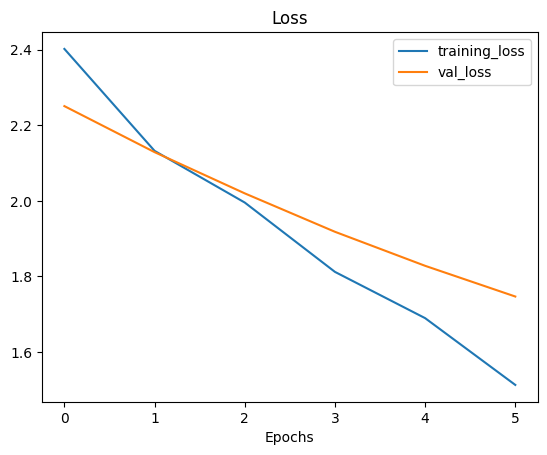

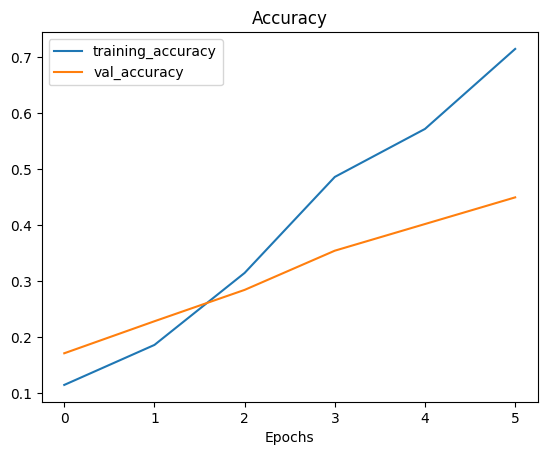

In [32]:
plot_loss_curves(history_1) 

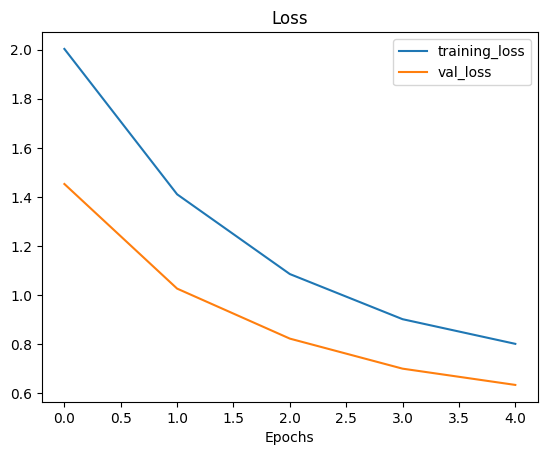

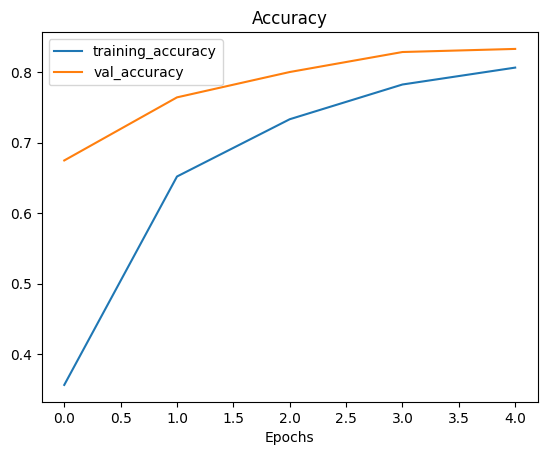

In [33]:
plot_loss_curves(history_2)

## Create a ModelCheckpoint callback

The model checkpoint callback intermediately saves our model (the full model or just the weights) during training. This is useful so we can come and start where we left of. 

In [34]:
print(model_0.evaluate(test_ds))                    
model_2_results = model_2.evaluate(test_ds)

print(model_2_results)

79/79 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.8672 - loss: 0.5105
[0.5224806070327759, 0.8655999898910522]
79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.8463 - loss: 0.6121
[0.6335679888725281, 0.8331999778747559]


In [35]:
## Loading checkpointed weights 
# Loading in checkpointed weights returns a model to a specific checkpoint  

model_2.load_weights("/workspace/tensorflow/tensorboard/ten_percent_data_aug/ckpt-epoch05.weights.h5")

In [36]:
# evaluate mmodel_2 with loaded weights
model_2_from_weights = model_2.evaluate(test_ds)
print(model_2_from_weights)

79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.8440 - loss: 0.6128
[0.6335679292678833, 0.8331999778747559]


In [37]:
# Check if loaded results are very close to previus results 

np.isclose(np.array(model_2_results), np.array(model_2_from_weights))

array([ True,  True])

In [38]:
# check the difference 

print(np.array(model_2_results) - np.array(model_2_from_weights))

[5.96046448e-08 0.00000000e+00]


# Experiment fine tuning 

### Fine Tuning: Model-2 with top layer trained on custom data, top layers unfrozen

> **Note** : Fine tuning usually works best **after** training a feature extraction model for a few epochs with large amounts of custom data

#### Model-3 will be fined to version of Model-2 for further n number of epochs 

In [39]:
## Model-3: Fine tuning and existing data for 10 percent 
model_2.layers

[<InputLayer name=input_layer, built=True>,
 <Sequential name=data_augmentation, built=True>,
 <Functional name=efficientnetv2-b0, built=True>,
 <GlobalAveragePooling2D name=gap, built=True>,
 <Dense name=output_layer, built=True>]

In [40]:
## Are these layers are trainable 
for layer in model_2.layers: 
    print(layer, layer.trainable)

<InputLayer name=input_layer, built=True> True
<Sequential name=data_augmentation, built=True> True
<Functional name=efficientnetv2-b0, built=True> False
<GlobalAveragePooling2D name=gap, built=True> True
<Dense name=output_layer, built=True> True


In [41]:
# How many trainable variables are in our base model? 

print(len(model_2.layers[2].trainable_variables))

0


In [42]:
model_2.outputs

[<KerasTensor shape=(None, 10), dtype=float32, sparse=False, name=keras_tensor_1380>]

In [43]:
# Set last 10 layers in base model.trainable=True

# 1. set all to True 
base_model.trainable = True 

# 2. Freeze all layers except last 10 
for layer in base_model.layers[:-10]: 
    layer.trainable=False

# 3. Recompile the model (also need adjusting learning rate at least by 10x) 

model_2.compile(
    loss=keras.losses.CategoricalCrossentropy(), 
    optimizer=keras.optimizers.Adam(learning_rate=0.0001), 
    metrics=["accuracy"]
)


In [44]:
print(len(model_2.layers[2].trainable_variables))

10


In [45]:
model_2.summary()

Model: "experiment_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 10)             │        12,810 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,932,122 (22.63 MB)

 Trainable params: 594,490 (2.27 MB)

 Non-trainable params: 5,337,632 (20.36 MB)

In [46]:
for layer in model_2.layers: 
    print(layer.name, layer.trainable)

input_layer True
data_augmentation True
efficientnetv2-b0 True
gap True
output_layer True


In [47]:
fine_tune_epochs = initial_epochs + 5
history_2_fined_10_percent = model_2.fit(
    train_ds,
    validation_data=test_ds, 
    validation_steps=int(0.25 * (len(test_ds))),
    callbacks=[
        create_tensorboard_callback(
            dir_name="/workspace/tensorflow/tensorboard/", 
            experiment_name="ten_percent_data_aug_fine_tuned_last_10_layers"
        ),
        create_model_checkpoint_callback(
            dir_name="/workspace/tensorflow/tensorboard/", 
            experiment_name="ten_percent_data_aug_fine_tuned_last_10_layers"
        )
    ],
    initial_epoch=history_2.epoch[-1] + 1, # Start from last epoch
    epochs=fine_tune_epochs, 
    verbose=2
)

Saving TensorBoard log files to /workspace/tensorflow/tensorboard/ten_percent_data_aug_fine_tuned_last_10_layers/20251223-050321
Epoch 6/10

Epoch 6: saving model to /workspace/tensorflow/tensorboard/ten_percent_data_aug_fine_tuned_last_10_layers/ckpt-epoch06.weights.h5
24/24 - 15s - 609ms/step - accuracy: 0.7653 - loss: 0.9194 - val_accuracy: 0.8421 - val_loss: 0.6406
Epoch 7/10

Epoch 7: saving model to /workspace/tensorflow/tensorboard/ten_percent_data_aug_fine_tuned_last_10_layers/ckpt-epoch07.weights.h5
24/24 - 2s - 76ms/step - accuracy: 0.8013 - loss: 0.8461 - val_accuracy: 0.8553 - val_loss: 0.6101
Epoch 8/10

Epoch 8: saving model to /workspace/tensorflow/tensorboard/ten_percent_data_aug_fine_tuned_last_10_layers/ckpt-epoch08.weights.h5
24/24 - 2s - 79ms/step - accuracy: 0.8360 - loss: 0.7549 - val_accuracy: 0.8470 - val_loss: 0.5903
Epoch 9/10

Epoch 9: saving model to /workspace/tensorflow/tensorboard/ten_percent_data_aug_fine_tuned_last_10_layers/ckpt-epoch09.weights.h5
24/2

In [48]:
results_fine_tune_10_percent = model_2.evaluate(test_ds)
results_fine_tune_10_percent

79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.8590 - loss: 0.4946


[0.5042628049850464, 0.8592000007629395]

In [49]:
model_2_results

[0.6335679888725281, 0.8331999778747559]

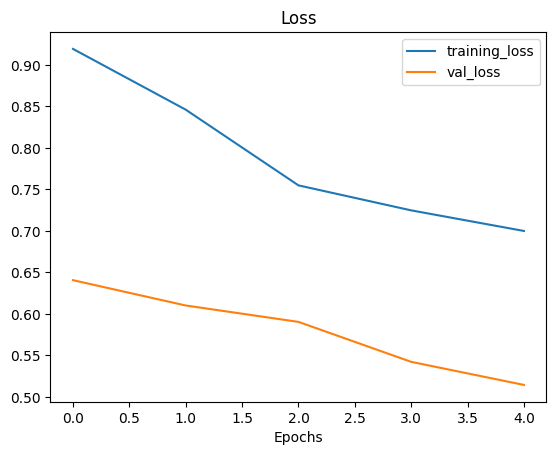

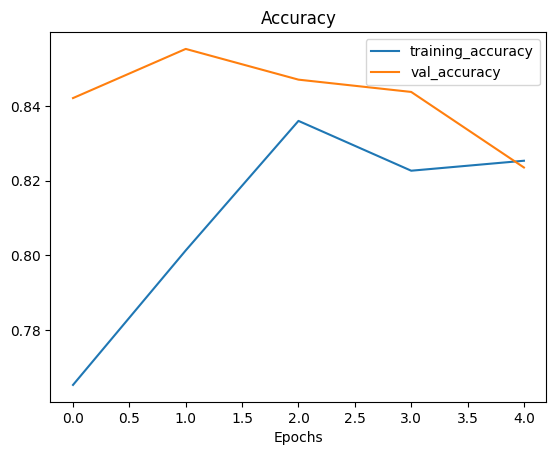

In [50]:
plot_loss_curves(history_2_fined_10_percent)

In [51]:
# Create `plot_loss_curves` for before and after fine tuning

In [52]:
def compare_history(original_history, new_history): 
    initial_epochs=original_history.epoch[-1]

    ## Original history measurements 
    acc = original_history.history['accuracy']
    loss = original_history.history['loss']

    val_acc = original_history.history['val_accuracy']
    val_loss = original_history.history['val_loss']

    # Combine with new history 

    total_acc = acc + new_history.history['accuracy']
    total_loss = loss + new_history.history['loss']

    total_val_acc = val_acc + new_history.history['val_accuracy']
    total_val_loss = val_loss + new_history.history['val_loss']

    ## Plot total_acc and total_val_acc 
    plt.figure(figsize=(8, 8))

    plt.subplot(2, 1, 1)
    plt.plot(total_acc, label="accuracy")
    plt.plot(total_val_acc, label="val_accuracy")
    plt.plot([initial_epochs, initial_epochs], plt.ylim(), label="Start Fine Tuning")
    plt.legend() 
    plt.title("Traning and Validation Accuracy")

    plt.subplot(2, 1, 2)

    plt.plot(total_loss, label="loss")
    plt.plot(total_val_loss, label="val_loss")
    plt.plot([initial_epochs, initial_epochs], plt.ylim(), label="Start Fine Tuning")
    plt.legend()

    plt.title("Traning and Validation Losses")
    

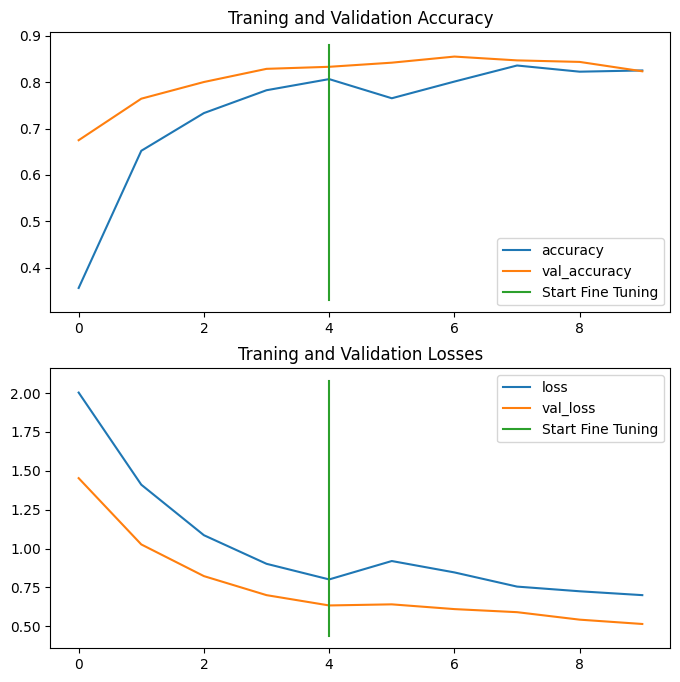

In [53]:
compare_history(original_history=history_2, 
               new_history=history_2_fined_10_percent)

In [54]:
# Load from weight from initial state
model_2.load_weights("/workspace/tensorflow/tensorboard/ten_percent_data_aug/ckpt-epoch05.weights.h5")

In [55]:
# Create full train & test data for full dataset 

full_train_ds, full_test_ds = import_and_create_train_test_ds(train_dir="data/10_food_classes_all_data/train/", 
                                                             test_dir="data/10_food_classes_all_data/test")

Found 7500 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


In [56]:
for layer in model_2.layers: 
    print(layer.name, layer.trainable)


input_layer True
data_augmentation True
efficientnetv2-b0 True
gap True
output_layer True


In [57]:
model_2.summary()

Model: "experiment_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 7, 7, 1280)     │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gap (GlobalAveragePooling2D)    │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 10)             │        12,810 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,121,104 (27.16 MB)

 Trainable params: 594,490 (2.27 MB)

 Non-trainable params: 5,337,632 (20.36 MB)

 Optimizer params: 1,188,982 (4.54 MB)

In [58]:
fine_tune_epochs = initial_epochs + 5
history_2_fined_100_percent = model_2.fit(
    full_train_ds,
    validation_data=full_test_ds, 
    validation_steps=int(0.25 * (len(test_ds))),
    callbacks=[
        create_tensorboard_callback(
            dir_name="/workspace/tensorflow/tensorboard/", 
            experiment_name="full_data_data_aug_fine_tuned_last_10_layers"
        ),
        create_model_checkpoint_callback(
            dir_name="/workspace/tensorflow/tensorboard/", 
            experiment_name="full_data_data_aug_fine_tuned_last_10_layers"
        )
    ],
    initial_epoch=history_2.epoch[-1] + 1, # Start from last epoch
    epochs=fine_tune_epochs, 
    verbose=2
)

Saving TensorBoard log files to /workspace/tensorflow/tensorboard/full_data_data_aug_fine_tuned_last_10_layers/20251223-050348
Epoch 6/10

Epoch 6: saving model to /workspace/tensorflow/tensorboard/full_data_data_aug_fine_tuned_last_10_layers/ckpt-epoch06.weights.h5
235/235 - 16s - 69ms/step - accuracy: 0.7612 - loss: 0.8635 - val_accuracy: 0.8898 - val_loss: 0.3888
Epoch 7/10

Epoch 7: saving model to /workspace/tensorflow/tensorboard/full_data_data_aug_fine_tuned_last_10_layers/ckpt-epoch07.weights.h5
235/235 - 10s - 42ms/step - accuracy: 0.7992 - loss: 0.6715 - val_accuracy: 0.9046 - val_loss: 0.3278
Epoch 8/10

Epoch 8: saving model to /workspace/tensorflow/tensorboard/full_data_data_aug_fine_tuned_last_10_layers/ckpt-epoch08.weights.h5
235/235 - 10s - 43ms/step - accuracy: 0.8223 - loss: 0.5942 - val_accuracy: 0.9095 - val_loss: 0.2893
Epoch 9/10

Epoch 9: saving model to /workspace/tensorflow/tensorboard/full_data_data_aug_fine_tuned_last_10_layers/ckpt-epoch09.weights.h5
235/235

In [59]:
model_2.evaluate(full_test_ds)

79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.9219 - loss: 0.2539


[0.25654512643814087, 0.9187999963760376]

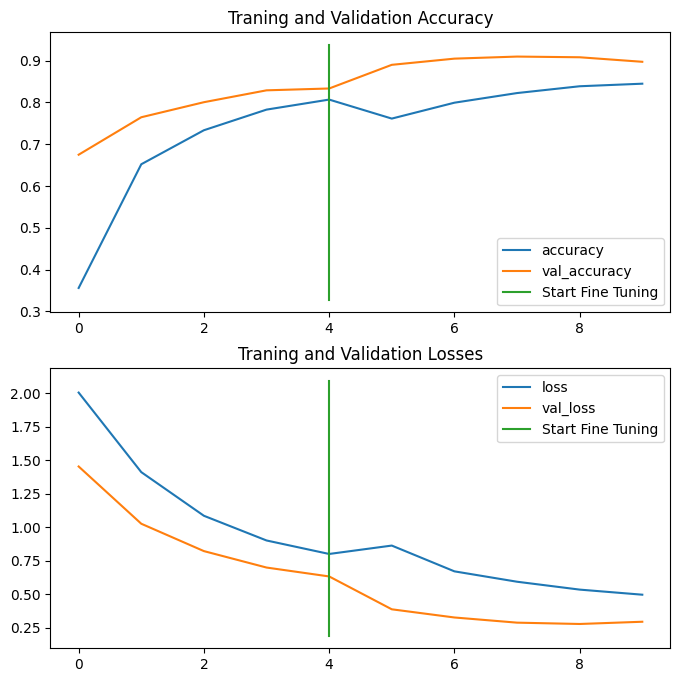

In [60]:
compare_history(original_history=history_2, 
               new_history=history_2_fined_100_percent)

In [61]:
results_fine_tune_100_percent = model_2.evaluate(full_test_ds)

79/79 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.9252 - loss: 0.2435


In [62]:
results_fine_tune_10_percent

[0.5042628049850464, 0.8592000007629395]

In [63]:
display_tensorboard_logs()